#  Introduction to Machine Learning algorithms

**Author:** 'Felipe Millacura'
    
**Date:** '2nd April 2021'

### Learning Objectives

* Know the difference between supervised and unsupervised algorithms
* Be able to use `scikit-learn` to build models.
* Understand some of the differences between model building in Python.
* Practice with both `LinearRegression` and `LogisticRegression`.
* Create `DecissionTrees`.
* Understand how a `random forest` classifier works.
* See examples of `HieararchicalClustering` and `K-means`
* Comprehend `correlation` and `causation` 

## Machine learning problems


You may have seen predictions of data via linear regression. This is one of the main types of machine learning problems. Some other type of problems we will here cover are sorting data into categories/classes (logistic regression) and clustering. Let’s first touch on the differences between the three:


**Regression**: Regression can be framed as a kind of machine learning problem that tries to predict a continuous value output from input data. The input here are *predictors*, and the output is known as the *response*. Predicting a person’s income from their age, education is example of regression task.


**Classification**: The goal of this technique is to predict whether a certain data point belongs to a certain category. In classification the data we have is categorised under different labels according to some parameters. The *classifier* learns how to sort the data you have into either of your categories. When you feed it unseen data, and it will attempt to assign labels to the new data (i.e. it tries to “class” your unseen data). What is important to remember for classification problems is that the labels (or classes) you are assigning to your data are known before hand. Classifying emails as either spam or not spam is example of classification problem.


**Clustering**: Clustering is the task of partitioning the dataset into groups, called clusters. In clustering you are trying to group data points that are similar together into clusters, while ensuring the clusters themselves are dissimilar to one another. You can think of it as classification, without saying to which classes the data points belong to, or how many classes there are. It determines grouping among unlabelled data. For example, you might be given a set of animal photos that you need to group into species. You may not know how many different animals are in your database, and so you could use clustering algorithms to wade through and specify groups for you.

## Supervised and unsupervised learning

The types of algorithm we can use in our learning will each be best-suited to a particular task. Which one we want to use at any given point will depend on what we’re trying to learn and the data we have available to learn from. We can split our algorithms into two broad categories: `supervised` and `unsupervised`. Clustering is a method of unsupervised learning and is a common technique for statistical data analysis used in many fields. Since this is our first foray into unsupervised learning, let’s recap on what this is first.



## Supervised Learning

Most of the machine learning done in a practical setting falls under the banner of **supervised** learning. We have a collection of input variables `x` and an identified target variable `Y`. Our aim is to find some function of `x` which we can use to predict future values of `Y`, ie. 

$$Y = f(x)$$

We can do this because we have a training set available where all of the data is appropriately labelled and cleaned. Using that data we can approximate the function `f` so that it accurately predicts `Y` all of the time (although not _too_ accurately - remember our earlier discussions of overfitting).

For example we may have customer data (of which we have an extract of below) and we have 'labels' of whether they purchased or didn't purchase an item, the `purchased_item` column. We may want to use supervised learning to create a function i.e. a model to predict the label i.e. whether someone purchased or not, depending on `x`s, which in our case is variables of information about the customer (age, gender etc.). 

<br>


In [1]:
import pandas as pd
import numpy as np

In [2]:
customers = pd.DataFrame({
    'customer_id':[1,2,3,4,5,6],
    'age':[34,87,40,30,33,65],
    'gender':['M','F','F','M','M','M'],
    'purcahsed_item':['Y','Y','N','N','Y','Y']
    
})

In [3]:
customers.head()

,customer_id,age,gender,purcahsed_item
0,1,34,M,Y
1,2,87,F,Y
2,3,40,F,N
3,4,30,M,N
4,5,33,M,Y


Because we know what we should be getting back from the function, the observed case of whether the customer purchased or not, we are able to fine-tune it as we go (by train/tesing) and make changes if necessary. This is where the supervision comes in; we are **supervising the model's development**. Once the algorithm reaches a performance level which we deem to be acceptable we can terminate the development process.

We can sub-divide supervised learning into two types of problem, which we have already touched on this module:

* Regression
* Classification

## Unsupervised Learning

The counterpart to supervised learning is **unsupervised** learning. Although the name implies that it will be the opposite, there are in fact many common features between the two: we still need to provide input variables, and we still use the function generated by the algorithm to to predict future output values.

The main difference is in how we guide the learning, namely that **we don't**. Although the general formula looks the same as it did before, in unsupervised learning we have no knowledge of the expected values of `Y` to guide us. Instead of trying to build a function around the predictors in such a way that they model some expected output we let the algorithm discover interesting patterns in the data before presenting a model based on those patterns.

Unsupervised learning can also be sub-categorised into different types of problem:

* Clustering
* Association


> Are regression algorithms a form of supervised or unsupervised learning?
<details>
<summary><b>Answer</b></summary>
Supervised
</details>


### Additional Resources


[Supervised vs unsupervised learning](https://towardsdatascience.com/supervised-vs-unsupervised-learning-14f68e32ea8d)

[A guide to selecting an algorithm](https://hackernoon.com/choosing-the-right-machine-learning-algorithm-68126944ce1f)

A bit needed on variable engineering:

[End-to-end model development](https://towardsdatascience.com/machine-learning-general-process-8f1b510bd8af)

[More on variable scaling](https://medium.com/greyatom/why-how-and-when-to-scale-your-features-4b30ab09db5e)


## Machine Learning in Python

In this lesson you’ll learn how to do some statistical modelling techniques in Python. Python was not designed for statistics, and while it is possible to do all types of statistical tests in Python, it’s not as straight forward.

Python is generally designed for machine learning. This generally means models are focused on predictive accuracy, rather than interpretation. Python also has a focus on machine learning pipelines; this forces you to think more about how your data is going to be processed.

With modern programming languages there is very few techniques that you can’t do in some languages. The differences lie in what is easy to do, rather than what is possible.

## Linear Regression

#### Initial data exploration

To start we are going to see an example of building a linear model. The dataset we are going to use is `conspiracy_belief_score.csv`. This dataset comes from the Open Psychometrics project [Read more here](https://www.frontiersin.org/articles/10.3389/fpsyg.2013.00279/full). It has information on the conspiracy belief score for people who took an online test. We also have information on people backgrounds, including their age, gender and where they live. Before we start building models we need to make sure we understand the data.

First we read the data in:

In [4]:
import pandas as pd

conspiracy_belief = pd.read_csv("data/conspiracy_belief_score.csv")

In [5]:
conspiracy_belief.head()

,conspiracy_belief_score,education,childhood,gender,hand,family_size,age,test_time
0,4.333333,Less than high school,Suburban,Female,Right,1,14,125
1,2.466667,Graduate degree,Suburban,Female,Right,2,26,141
2,3.666667,University degree,Rural (country side),Male,Right,3,25,58
3,3.933333,High school,Suburban,Male,Right,2,37,105
4,1.000000,University degree,Rural (country side),Male,Right,2,34,87


In [6]:
conspiracy_belief.describe()

,conspiracy_belief_score,family_size,age,test_time
count,2301.000000,2301.000000,2301.000000,2301.000000
mean,2.887266,2.519774,27.621034,147.853542
std,1.033407,1.323426,13.312523,352.173772
min,0.866667,0.000000,13.000000,3.000000
25%,2.066667,2.000000,18.000000,82.000000
50%,2.866667,2.000000,22.000000,107.000000
75%,3.666667,3.000000,34.000000,141.000000
max,5.000000,19.000000,75.000000,9881.000000


In [7]:
conspiracy_belief.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2301 entries, 0 to 2300
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   conspiracy_belief_score  2301 non-null   float64
 1   education                2301 non-null   object 
 2   childhood                2301 non-null   object 
 3   gender                   2301 non-null   object 
 4   hand                     2301 non-null   object 
 5   family_size              2301 non-null   int64  
 6   age                      2301 non-null   int64  
 7   test_time                2301 non-null   int64  
dtypes: float64(1), int64(3), object(4)
memory usage: 143.9+ KB


There is lots you could do to explore this data using `pandas` and `seaborn`, but we're going to cheat by using a Python package!

Install `pandas profiling` using the following command in the terminal.

In [ ]:
!pip install pandas-profiling

This package has a function `ProfileReport` which has lots of plots and summaries that are particularly useful for doing modelling. Run this now.

In [8]:
import pandas_profiling as pp


In [9]:
pp.ProfileReport(conspiracy_belief)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Task - 5 minutes**

Have a look at the report.

* Do you see anything that needs to be cleaned?

* How well do you think the model will work?


## Cleaning data

After you have explored the data you’ll need to clean the data. As you know from previous lessons and projects, there are lots of things you might need to do to clean the data.

We have given you a nice clean dataset here so the only thing we need to do is create [`dummy variable`](https://conjointly.com/kb/dummy-variables/)s.

## Creating dummies

Unlike other programming languages, when you are working in Python you need to create dummies yourself. Luckily, there is a function from pandas that makes this easy called [`get_dummies`](https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html).

In [10]:
conspiracy_belief = pd.get_dummies(conspiracy_belief, drop_first = True)

conspiracy_belief.head()

,conspiracy_belief_score,family_size,age,test_time,education_High school,education_Less than high school,education_University degree,childhood_Suburban,"childhood_Urban (town, city)",gender_Male,gender_Other,hand_Right
0,4.333333,1,14,125,0,1,0,1,0,0,0,1
1,2.466667,2,26,141,0,0,0,1,0,0,0,1
2,3.666667,3,25,58,0,0,1,0,0,1,0,1
3,3.933333,2,37,105,1,0,0,1,0,1,0,1
4,1.000000,2,34,87,0,0,1,0,0,1,0,1


We set `drop_first = True` because for a variable with four levels, you only need three dummy variables. Check more [here](https://www.kaggle.com/c/instant-gratification/discussion/92817)

## Building the model

Now finally we can build our model!

To build all the models today we are going to use a package called [`scikit-learn`](https://scikit-learn.org/stable/). This package has a huge range of different models, and almost every model you could ever need is inside `scikit-learn`.

You do not need to install anything, as `scikit-learn` comes as part of Anaconda.

Since `scikit-learn` is so large, we normally import the models one at a time.

# Simple linear regression 

Regression analysis is one of the most important fields in statistics and machine learning. Regression searches for relationships among variables and there are many regression methods available. Linear regression is one of them [Read more](https://realpython.com/linear-regression-in-python/)

## What model do we fit?

In simple linear regression we typically model our data with a **line**, i.e. we fit a line to the data. We write the equation of the line as

$$\widehat{y} = b_0 + b_1 \times x$$

where, by convention

* $\widehat{y}$ is used to indicate a **fitted** $y$-value (outcome)
* we label the **intercept** $b_0$
* we label the **slope** $b_1$. Sometimes we might label the slope as $b_\textrm{<name>}$ where $\textrm{<name>}$ is the explanatory variable, e.g. $b_{\textrm{weight}}$

So in our case, we would fit an equation of the form

$$\widehat{height} = b_0 + b_{\textrm{weight}} \times \textrm{weight} $$

Let's see some sample data that we might want to fit

In [11]:
from sklearn.linear_model import LinearRegression

The inputs (regressors, 𝑥) and output (predictor, 𝑦) should be arrays (the instances of the class `np.ndarray`) or similar objects. This is the simplest way of providing data for regression:

In [12]:
x = np.array([5, 15, 25, 35, 45, 55]).reshape((-1, 1))
y = np.array([5, 20, 14, 32, 22, 38])


Now, you have two arrays: the input x and output y. You should call .reshape() on x because this array is required to be two-dimensional, or to be more precise, to have one column and as many rows as necessary. That’s exactly what the argument (-1, 1) of `.reshape()` specifies. 

In [13]:
x

array([[ 5],
       [15],
       [25],
       [35],
       [45],
       [55]])

In [14]:
y

array([ 5, 20, 14, 32, 22, 38])

Then we define the model we want to use and fit it using the data we extracted. Here we will use [`LinearRegression`](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)

In [15]:
model = LinearRegression()

In [16]:
model.fit(x, y)

LinearRegression()

With `.fit()`, you calculate the optimal values of the weights 𝑏₀ and 𝑏₁, using the existing input and output (x and y) as the arguments. In other words, `.fit()` fits the model. It returns self, which is the variable model itself. That’s why you can replace the last two statements with this one:

In [17]:
model = LinearRegression().fit(x, y)


Once you have your model fitted, you can get the results to check whether the model works satisfactorily and interpret it. We can pull out the [R-squared](https://towardsdatascience.com/statistics-for-machine-learning-r-squared-explained-425ddfebf667) value by using the score method.

In [18]:
model.score(x, y)

0.7158756137479542

When you’re applying `.score()`, the arguments are also the predictor x and regressor y, and the return value is 𝑅².

To get the coefficients, we need to do it in two parts. We get the coefficient for the intercept (𝑏₀) by looking at the `intercept_` attribute.

In [19]:
model.intercept_

5.633333333333329

And we get the rest of the coefficients (𝑏₁) using the `coef_` attribute. These coefficients are returned in the same order as the variables appear in the data.

In [20]:
model.coef_

array([0.54])

Now let's try with our dataset!

In [21]:
Y = conspiracy_belief["conspiracy_belief_score"]
X = conspiracy_belief.drop(columns = "conspiracy_belief_score")

In [22]:
model2 = LinearRegression().fit(X,Y)

In [23]:
model2.intercept_

2.3970967575928044

In [24]:
model2.coef_

array([ 3.87812859e-02,  7.39820803e-03,  1.05323590e-04,  4.34347163e-01,
        3.32422446e-01,  1.45233709e-01, -5.03516396e-02,  1.10445101e-01,
       -2.09621506e-01,  5.34224823e-03, -2.52485900e-02])

In [25]:
conspiracy_belief.drop(columns = "conspiracy_belief_score").columns

Index(['family_size', 'age', 'test_time', 'education_High school',
       'education_Less than high school', 'education_University degree',
       'childhood_Suburban', 'childhood_Urban (town, city)', 'gender_Male',
       'gender_Other', 'hand_Right'],
      dtype='object')

#### Interpretation

These are very low `R-squared` values. We’re not doing a very good job at predicting conspiracy belief score!

 -| Variable | Coefficient
---|---|---
0|                      family_size   |  0.038781
1 |                              age   |  0.007398
2  |                       test_time   |  0.000105
3   |          education_High school   |  0.434347
4  | education_Less than high school   |  0.332422
5   |    education_University degree  |   0.145234
6    |            childhood_Suburban   | -0.050352
7    |  childhood_Urban (town, city)   |  0.110445
8    |                   gender_Male  |  -0.209622
9    |                  gender_Other  |   0.005342
10   |                    hand_Right  |  -0.025249

For every extra member of your family your conspiracy belief score increases by 0.037 etc.

These are hard to interpret because we don’t have the associated `p-values`.

Once there is a satisfactory model, you can use it for predictions with either existing or new data.

To obtain the predicted response, use `.predict()`:

In [27]:
y_pred = model.predict(x)

Which would be almost the same than

In [29]:
y_pred2 = model.intercept_ + model.coef_ * x

In [28]:
y_pred

array([ 8.33333333, 13.73333333, 19.13333333, 24.53333333, 29.93333333,
       35.33333333])

In [30]:
y_pred2.reshape((1, -1))

array([[ 8.33333333, 13.73333333, 19.13333333, 24.53333333, 29.93333333,
        35.33333333]])

In [31]:
y

array([ 5, 20, 14, 32, 22, 38])

In [32]:
import matplotlib.pyplot as plt

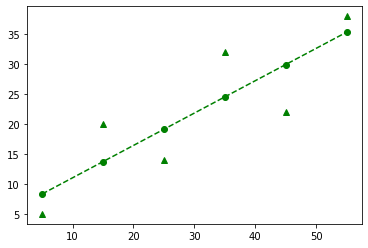

In [33]:
plt.plot(x, y, 'g^', x, y_pred, 'g--', x, y_pred2, 'go')

## Logistic Regression


### Continuous and binary dependent variables

So far, our regression fits have all involved a **continuous** dependent variable (AKA outcome variable). 
* How do things change when we have a **binary** (AKA 'dichotomous') dependent variable? 
* Why would such a circumstance ever arise?

Let's look at some data where this modelling requirement arises quite naturally. We want to build a model linking various attributes of mortgage applicants to the **final status** of their application (i.e. whether it was accepted or declined, a binary dependent variable). 

We've gathered data from 1000 recent applications. Let's have a look at it!


In [34]:
import janitor

In [35]:
mortgage_data = pd.read_csv('data/mortgage_applications.csv').clean_names()

In [36]:
mortgage_data.head()

,tuscore,employed,age,accepted
0,433,True,28,True
1,93,True,52,False
2,368,False,63,False
3,665,True,42,True
4,687,True,38,True


Here `tuscore` stands for 'TransUnion score', a credit score that ranges from $0$ to $710$; `employed` and `age` are self explanatory; and `accepted` is the binary dependent variable denoting final application status.


## Initial data exploration

The output of the `ProfileReport` function in the `pandas_profiling` package can be useful to investigate the relationships between a binary dependent and the various possible continuous or categorical independent variables.


In [37]:
pp.ProfileReport(mortgage_data)

Summarize dataset:   0%|          | 0/18 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Note that numerical correlation values are mostly absent in this plot, due to the fact that we have only one pairing of numerical variables: `tuscore` and `age`. Direct visualisation is arguably more useful when investigating the relationships between continuous and binary variables, but if you really want or need a numerical measure, consider using the **point-biserial correlation** rather than the standard Pearson correlation you have been using up until now.

Focussing on the `accepted` column, we see that it shows a strong relationship with `tuscore`, and there is also a significant relationship between `employed` and `accepted` (in that, if you are employed, your probability of being accepted is approximately 0.5, whereas if you are unemployed, you have a much smaller probability of acceptance). The `accepted` probability seems not to vary significantly with `age`. We also see a significant relationship between `employed` status and `tuscore`.

Let's ignore the `employed` and `age` variables for the moment and focus on `tuscore`. Let's plot the relationship between `tuscore` and `accepted`:


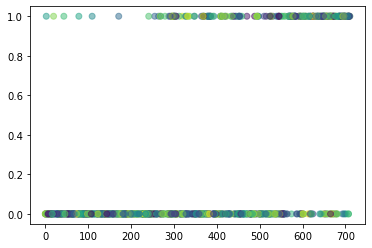

In [43]:
colors = np.random.rand(1000)
plt.scatter(mortgage_data.tuscore, mortgage_data.accepted, 
            c=colors, 
            alpha=0.5)
plt.show()

The question is: how do we model this data? Is a simple linear regression a good idea? Let’s see…

In [39]:
x3 = mortgage_data.tuscore.values.reshape(-1, 1)
y3 = mortgage_data.accepted
model3 = LinearRegression().fit(x3, y3)

In [40]:
y3_pred = model3.predict(x3)

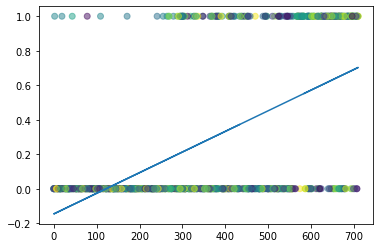

In [41]:
plt.scatter(mortgage_data.tuscore, mortgage_data.accepted, c=colors, alpha=0.5)
plt.plot(x3, y3_pred) 
plt.show()

This is a terrible fit! We can view the regression line as an (albeit rubbish) attempt to estimate *how the mean probability of getting a mortgage application accepted varies with `tuscore`*.

To see this, imagine we focus on one `tuscore` value, say $594$, and then look at the outcomes for that value


In [44]:
mortgage_data[mortgage_data['tuscore'] == 594]

,tuscore,employed,age,accepted
5,594,True,27,False
118,594,True,47,False
329,594,True,33,True
388,594,True,36,True
407,594,True,45,True


So, three applications accepted and two declined for this score suggests that the empirical probability of being accepted at this score $p(\textrm{tuscore = 594}) = 0.6$. The linear regression will try to provide a set of best-estimates $\widehat{p}(\textrm{tuscore})$ across the range of independent variables.

But, the $\widehat{p}$ values predicted by the model are not satisfactory. For a start, the regression clearly does not fit the data very well, and it predicts **negative** probabilities at low `tuscore`. These values cannot even be interpreted as probabilities!

We need a better model to fit to this data, a model that generates probabilities within the proper bounds. This is where the **logistic function** comes in!


# The logistic function

The **logistic function** provides a far better model for the estimated probability of 'success' on a binary outcome. The general form of the function is 

$$f(x)=\frac{L}{1+e^{-k \times (x-x_0)}} $$

Let's just play around with this function and plot it for a range of $L$, $k$ and $x_0$ values.

**No need to code along with what follows if time is short**


In [45]:
def logistic(x, L = 1, k = 1, x0 = 0 ):
      return(L / (1 + np.exp(-k * (x - x0)))) 

In [46]:
logistic_data_l = pd.DataFrame({
    'x':np.arange(-6,6,0.1)
    
})

logistic_data_l['L1'] = logistic(logistic_data_l['x'], L=1)
logistic_data_l['L2'] = logistic(logistic_data_l['x'], L=2)
logistic_data_l['L3'] = logistic(logistic_data_l['x'], L=3)


In [47]:
logistic_data_l.head(2)

,x,L1,L2,L3
0,-6.0,0.002473,0.004945,0.007418
1,-5.9,0.002732,0.005464,0.008196


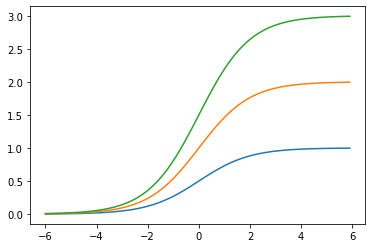

In [48]:
plt.plot(logistic_data_l['x'], logistic_data_l[['L1','L2', 'L3']])

The logistic curves are all 'S-shaped'. This already looks more promising than the straight line of simple linear regression for fitting the data distribution we saw above. We'll use regression to fit a logistic curve to our data! 

We see that $L$ affects the **maximum value** of $f(x)$. We're going to use $f(x)$ to model probability $p$, which must be in the range $0 \le p \le 1$, so we'll set $L=1$ in everything that follows.


In [51]:
logistic_data_k = pd.DataFrame({'x':np.arange(-6, 6, 0.1)}) 

logistic_data_k['k1'] = logistic(logistic_data_l['x'], k=1)
logistic_data_k['k2'] = logistic(logistic_data_l['x'], k=2)
logistic_data_k['k4'] = logistic(logistic_data_l['x'], k=4)
logistic_data_k['k_1'] = logistic(logistic_data_l['x'], k=-1)
logistic_data_k['k_2'] = logistic(logistic_data_l['x'], k=-2)


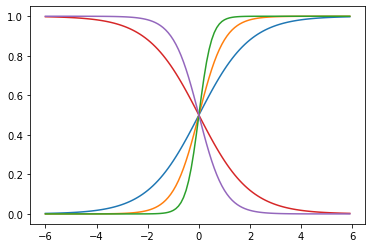

In [50]:
plt.plot(logistic_data_k['x'], logistic_data_k[['k1','k2', 'k4','k_1','k_2']])

The **sign** of $k$ affects whether $f(x)$ is 'high on the right and low on the left', or vice-versa. In some modelling applications, we want the probability of 'success' to be high for **low** values of the independent variable, and in others, to be high for **high** values of the independent variable, so we need the ability to alter $k$ in the fit. The **size** of $k$ affects the 'steepness' of the 'S': large values means a steeper curve.


In [52]:
logistic_data_x0 = pd.DataFrame({'x':np.arange(-6, 6, 0.1)}) 

logistic_data_x0['x00'] = logistic(logistic_data_x0['x'], x0=0)
logistic_data_x0['x01'] = logistic(logistic_data_x0['x'], x0=1)
logistic_data_x0['x02'] = logistic(logistic_data_x0['x'], x0=2)
logistic_data_x0['x0_1'] = logistic(logistic_data_x0['x'], x0=-1)
logistic_data_x0['x0_2'] = logistic(logistic_data_x0['x'], x0=-2)

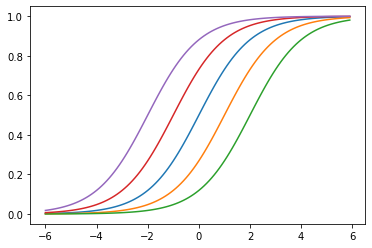

In [53]:
plt.plot(logistic_data_x0['x'], logistic_data_x0[['x00','x01', 'x02','x0_1','x0_2']])

So, $x_0$ affects the location of the 'step' in the function. To be precise, $f(x_0)=0.5$, so positive values shift $f(x)$ to the right, and negative values shift it to the left.

Initially, we'll limit ourselves to a single continuous independent variable $x$, as in the simple linear regression we've studied already. Rather than changing $k$ and $x_0$ in the fit, we'll mimic simple linear regression and use $b_0$ and $b_1$ instead.

Our model for the estimated probability as a function of $x$, $\widehat{\textrm{prob}}(x)$, is then

$$\widehat{\textrm{prob}}(x)=\frac{1}{1+e^{-(b_0+b_1 \times x)}} $$


# Making the model linear

The logistic function looks difficult to fit to data. Can we transform it into something linear? Let's use a little bit of algebra and what we recapped on logarithms and exponentials to tackle this.

First, we work with **odds** rather than probabilities. Odds may be familiar to you from gambling: in this case, they are defined as the ratio of 'successes' to 'failures'. So, if we toss a fair coin, the odds of 'getting a head' are one-to-one $1:1 = \frac{1}{1}=1.0$. 


First, here's the definition of odds in terms of the probability

$$\textrm{odds}_\textrm{success}(x)=\frac{\widehat{\textrm{prob}}(x)}{1-\widehat{\textrm{prob}}(x)}$$

Next, we rewrite the probability in terms of the odds. Click below to follow the details of this if you're interested.<br><br>


<details class='maths'>
<summary><b>Writing the probability in terms of the odds - mathematical details</b></summary>

We save ourselves some effort, and just write $\textrm{odds}_\textrm{success}(x)$ as $\textrm{odds}$, and $\widehat{\textrm{prob}}(x)$ as $\widehat{\textrm{prob}}$. Multiplying both sides of the equation above by $1-\widehat{\textrm{prob}}$ we get

$$(1-\widehat{\textrm{prob}}) \times \textrm{odds} =  \widehat{\textrm{prob}}$$

so that

$$\textrm{odds} - \widehat{\textrm{prob}} \times \textrm{odds} = \widehat{\textrm{prob}}$$

and then

$$\textrm{odds} = \widehat{\textrm{prob}} \times (1+\textrm{odds})$$

so finally

$$\widehat{\textrm{prob}} = \frac{\textrm{odds}}{1+\textrm{odds}}$$

</details>


We finally get

$$\widehat{\textrm{prob}} = \frac{\textrm{odds}}{1+\textrm{odds}}$$

Remember the logistic function above for $\widehat{\textrm{prob}}$. We substitute this in for $\widehat{p}$

$$\frac{1}{1+e^{-(b_0+b_1 \times x)}} = \frac{\textrm{odds}}{1+\textrm{odds}}$$

Now we try to make this equation **linear** (i.e. 'get $b_0$ and $b_1$ out of the exponent and 'down on the line'). We'll hide the mathematical manipulations that follow, it's not necessary to follow them, but click below if you'd like to see more!<br><br> 


We end up with

$$\ln(\textrm{odds}_\textrm{success}(x)) = b_0 + b_1 \times x $$

i.e. the natural logarithm of the odds of success equals something very much like we're used to seeing in linear regression. Consequently, this is a linear function: $b_0$ and $b_1$ are down 'on the line'! Don't worry too much about the fact we have $\ln(\textrm{odds}_\textrm{success}(x))$ on the left-hand side, this equation is basically of the form 

$$\widehat{y}=b_0+b_1 \times x$$

The **log-odds** function on the left hand side is also known as the **logit** function (pronounced 'low jit' or 'law jit' with a soft 'g')

$$\textrm{logit}(\widehat{\textrm{prob}}(x))= \ln \big(\textrm{odds}_\textrm{success}(x) \big)=\ln \Big( {\frac{\widehat{\textrm{prob}}(x)}{1-\widehat{\textrm{prob}}(x)}} \Big) $$

Let's see what the logit function looks like

In [55]:
def logit(x):
      return(np.log(x/(1-x)))

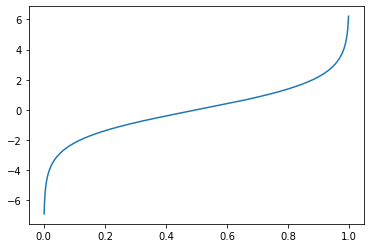

In [56]:
logit_data = pd.DataFrame({'p':np.arange(0.001, 0.999, 0.001)}) 

logit_data['logit'] = logit(logit_data['p'])

plt.plot(logit_data['p'], logit_data['logit'])

So $\textrm{logit}(p)$ provides the link between a continuous independent variable, which could take really large positive or negative values and a probability in the range $0 \le p \le 1$. To see this, note that any $\textrm{logit}(p)$ value on the graph above gives a $p$ in the correct range.

In simple linear regression, the interpretation of $b_1$ was straightforward: if the independent variable $x$ increases by one unit, then the estimate of the dependent variable $\widehat{y}$ changes by $b_1$ units, increasing or decreasing as $b_1$ is positive or negative, respectively.

The interpretation of $b_1$ in logistic regression is a little bit more complicated, due to the fact that we're using the *log-odds* as the dependent variable. We'll come back to the issue of interpretation after we've run a logistic regression.


## Enough chat, let's fit a model!


We used the `LinearRegression` function to perform a least squares fit of a simple linear regression model. There, it was easy to calculate the sum of squared errors as a measure of how well the model fits the data, as we had a set of $(x_i,y_i)$ sample data and the corresponding set of $(x_i, \widehat{y}_i)$ estimates from the regression. 

The situation is more complicated in the case of logistic regression, as we observe only binary outcomes directly (i.e. 'accepted'/'declined' for each application) and not the log-odds that we would need to fit the model using a least squares approach.

So, we use the **generalised linear model** fitting function `LogisticRegression` to do the job for us, using a fitting method called **maximum likelihood estimation**. Don't worry too much about this, we'll just think of `LogisticRegression` as a 'turbocharged' version of `LinearRegression`, free of some of its constraints!

Let's use `LogisticRegression` to run logistic regression on `mortgage_data`


In [57]:
from sklearn.linear_model import LogisticRegression

model4 = LogisticRegression()


For this example, since we are more interested in making predictions than interpreting the model, let’s split the data into a `test` and `training set`. We can do this using the function `train_test_split` from scikit-learn.

In [60]:
from sklearn.model_selection import train_test_split

Here we have set the `test_size` to 0.3, to take 30% of the data as a test set. Specifying `random_state` we make the random splitting of the data reproducible.

In [58]:
x4 = mortgage_data.tuscore.values.reshape(-1, 1)
y4 = mortgage_data.accepted

In [61]:
X_train, X_test, y_train, y_test = train_test_split(x4, y4, test_size = 0.3, random_state = 7)

The code above uses Python “syntactic sugar”. Since `train_test_split` returns a tuple, we can define several variables at once.

## Building the model

Now that we have the `test` and `training` set we can run our model. This time we are using **logistic regression**, so we need to use the imported `LogisticRegression` to define our model object and then fit to the training data.

In [62]:
model4.fit(X_train, y_train)

LogisticRegression()

Now we can see the `r-squared` value on the training data.

In [63]:
model4.score(X_train, y_train)

0.8385714285714285

And on the test data.

In [64]:
model4.score(X_test, y_test)

0.8433333333333334

In [65]:
y_pred = model4.predict(X_test)

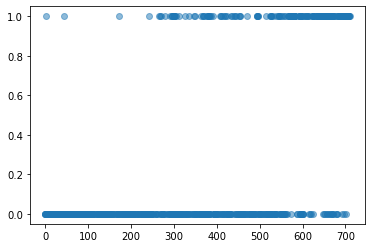

In [66]:
plt.scatter(X_train, y_train, alpha=0.5)

plt.show()

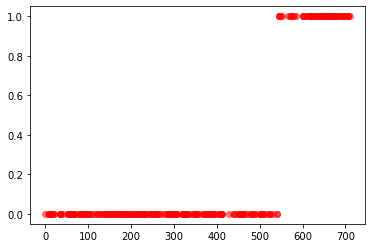

In [67]:
plt.scatter(X_test, y_pred, alpha=0.5, c='red')

Text(0.5, 1.0, 'Data predicted')

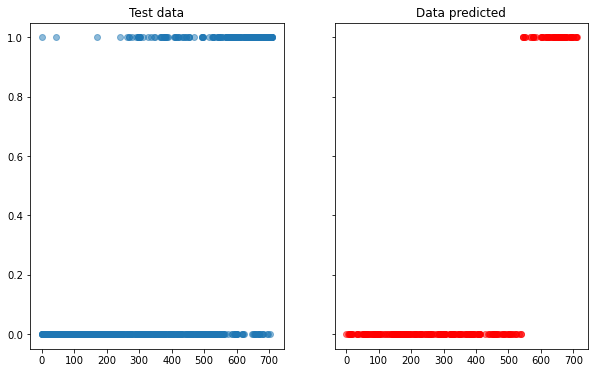

In [68]:
# Create two subplots and unpack the output array immediately
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True,figsize=(10,6))
ax1.scatter(X_train, y_train, alpha=0.5)
ax1.set_title('Test data')
ax2.scatter(X_test, y_pred, alpha=0.5, c='red')
ax2.set_title('Data predicted')

In [69]:
model4.coef_

array([[0.00873868]])

In [70]:
model4.intercept_

array([-4.73283319])

We can plot the logistic regression to see how classify values as either 0 or 1, by using [`expit`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.special.expit.html) to calculate the loss

In [71]:
from scipy.special import expit

In [72]:
loss = expit(X_test * model4.coef_ + model4.intercept_)

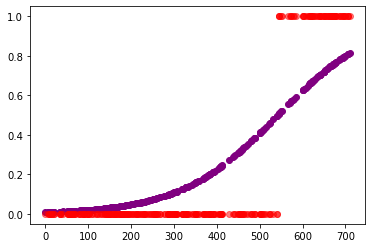

In [73]:
plt.scatter(X_test, loss, color='purple', linewidth=1) # model created
plt.scatter(X_test, y_pred, alpha=0.5, c='red') # predicted data

# Decision Trees


## What is a decision tree?

You may have come across a decision tree before in some form in the past, outwith the context of data or machine learning. For example, here is a simple one grounded in no data or algorithms. 

![](images/simple_simple_tree.png)


While this is a simplistic tree (not grounded in reality or data), it shows the idea behind a decision tree: a decision tree is a map of the possible outcomes of a series of related choices. 

These handy tools have also inspired wide variety of algorithms in Machine Learning both classification and regression. 


# Decision tree structure  


Let's take a more realistic and theoretical example. Consider you would like to go out for a nice bike ride. Your decision will depend upon various factors such as time, weather, temperature, etc. We call these factors as features which will influence our decision. Let's focus on weather. If you recorded all the factors relating to weather conditions alongside the decision you took, you could get a table something like this.

<br>

| Day       | Outlook  | Temperature | Humidity | Wind   | Go for a bike ride? |
|-----------|----------|-------------|----------|--------|---------------------|
| Monday    | Sunny    | Mild        | Low      | Strong | No                  |
| Tuesday   | Sunny    | Mild        | Low      | Weak   | Yes                 |
| Wednesday | Overcast | Cool        | Low      | Weak   | Yes                 |
| Thursday  | Rain     | Warm        | Normal   | Strong | No                  |
| Friday    | Rain     | Warm        | Normal   | Weak   | Yes                 |


You could express this in the form of a decision tree, which might look something like this:

![](images/simple_tree.png)

Going forward, you (or others) might be able to use this table to make decisions based on the data you've collected about whether or not to go for a bike ride. 

Decision trees take their name from their appearance: they resemble an upside-down tree, with the route at the top and branches splitting off as we traverse downwards. Each branch point represents a predicate based on a variable which our data either will or will not satisfy. These variables can be either categorical or continuous; a predicate can be generated in both cases. At the bottom of the tree are the "leaf" points, with a probability assigned to each that represents the probability that a given data point will satisfy the correct combination of predicates to reach that leaf, or representing the various classes in which the data can be classified (in our example above, the two classes are Yes and No).  


## Creating Decision trees in Python

To build our decision tree, we're going to revist the Game of Thrones dataset from earlier in the course. **We're going to use our dataset to build a decision tree predicting how likely it is that a character will die by the end of the (TV) series.** 

We're also going to use the following packages to help with building decision trees. Let's load these and the data now. 


In [74]:
thrones = pd.read_csv('data/character_data_S01-S08.csv')

In [75]:
thrones.head()

,id,name,sex,religion,occupation,social_status,allegiance_last,allegiance_switched,intro_season,intro_episode,...,icd10_place_text,top_location,geo_location,time_of_day,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,Unnamed: 40
0,100,Waymar Royce,1,9,2,2,3,1,1,1,...,Forest,2.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
1,101,Gared Tuttle,1,9,2,2,3,1,1,1,...,Forest,2.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2,102,Will,1,9,2,2,3,1,1,1,...,Other specified countryside,2.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
3,103,Irri,2,1,2,2,2,2,1,1,...,Home,1.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
4,104,Jon Snow,1,4,2,1,3,2,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Data cleaning 

Decision trees are slightly easier to prepare in one aspect: it's not necessary to scale the data. That's because a node of a tree partitions your data by comparing a feature (which splits dataset best), so it's not affected by different scales. 


We still need to remove any `NA`s from the dataset, plus do any necessary variable reduction. We also need to do some variable engineering, ensuring that all our columns are either a numeric type or factors and replacing any numeric values with string representations.


In this example we will do the variable reduction manually to save time. In normal circumstances this would be carried out using some of the techniques discussed before.

As a reminder, we're going to use our dataset to **build a decision tree predicting how likely it is that a character will die by the end of the (TV) series**. As such, there are a few columns directly connected to character death which we'll remove, plus a few which are totally redundant and some such as name which are irrelevant here - so we will just keep those remaining. Then we'll replace the numeric values with strings (using info from the data dictionary within the classnotes folder) so the factor levels have meaning. Finally we remove any `NA` values. To save time, we have done this below:



In [76]:
clean_thrones = thrones[['sex', 'religion', 'occupation', 'social_status', 'allegiance_last', 'allegiance_switched', 'dth_flag', 'featured_episode_count', 'prominence']]

In [77]:
clean_thrones['sex'] = clean_thrones['sex'].replace([1, 2, 9],['Male', 'Female', 'Unknown'])
clean_thrones['religion'] = clean_thrones['religion'].replace([0, 1, 3, 4, 5, 6, 7, 9],['Great Stallion', 'Lord of Light', 'Faith of the Seven', 'Old Gods', 'Drowned God', 'Many Faced God', 'Other', 'Unknown'])
clean_thrones['occupation'] = clean_thrones['occupation'].replace([1, 2, 9],['Silk-collar', 'Leather-collar', 'Unknown'])
clean_thrones['social_status'] = clean_thrones['social_status'].replace([1, 2, 9],['Highborn', 'Lowborn', 'Unknown'])
clean_thrones['allegiance_last'] = clean_thrones['allegiance_last'].replace([1, 2, 3, 4, 5, 6, 7, 8, 9],['Stark', 'Targaryen', 'Nights Watch', 'Lannister', 'Greyjoy', 'Bolton', 'Frey', 'Other', 'Unknown'])
clean_thrones['allegiance_switched'] = clean_thrones['allegiance_switched'].replace([1, 2, 9],['No', 'Yes', 'Unknown'])
clean_thrones['dth_flag'] = clean_thrones['dth_flag'].replace([0,1],['Survived', 'Died'])
clean_thrones = clean_thrones.dropna()

<ipython-input-77-a3caccac4ba6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_thrones['sex'] = clean_thrones['sex'].replace([1, 2, 9],['Male', 'Female', 'Unknown'])
<ipython-input-77-a3caccac4ba6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clean_thrones['religion'] = clean_thrones['religion'].replace([0, 1, 3, 4, 5, 6, 7, 9],['Great Stallion', 'Lord of Light', 'Faith of the Seven', 'Old Gods', 'Drowned God', 'Many Faced God', 'Other', 'Unknown'])
<ipython-input-77-a3caccac4ba6>:3: SettingWith

In [78]:
clean_thrones.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359 entries, 0 to 358
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   sex                     359 non-null    object 
 1   religion                359 non-null    object 
 2   occupation              359 non-null    object 
 3   social_status           359 non-null    object 
 4   allegiance_last         359 non-null    object 
 5   allegiance_switched     359 non-null    object 
 6   dth_flag                359 non-null    object 
 7   featured_episode_count  359 non-null    int64  
 8   prominence              359 non-null    float64
dtypes: float64(1), int64(1), object(7)
memory usage: 28.0+ KB


In [79]:
clean_thrones.head()

,sex,religion,occupation,social_status,allegiance_last,allegiance_switched,dth_flag,featured_episode_count,prominence
0,Male,Unknown,Leather-collar,Lowborn,Nights Watch,No,Died,1,1.0000
1,Male,Unknown,Leather-collar,Lowborn,Nights Watch,No,Died,1,1.0000
2,Male,Unknown,Leather-collar,Lowborn,Nights Watch,No,Died,1,1.0000
3,Female,Lord of Light,Leather-collar,Lowborn,Targaryen,Yes,Died,13,1.6250
4,Male,Old Gods,Leather-collar,Highborn,Nights Watch,Yes,Survived,63,6.9041


As we can see from the output of `info()`, we now have 359 data points with 9 variables each.


## Train/test split

The next step is to create a training and testing data set. Let's have 80% of our data going into the training set, and the remaining 20% go in our test set.  

First, let's shuffle the data, which helps to ensure we are selecting random training and test sets. In this particular instance, we are going to do something called *set the seed* using `random_state`. 


In [80]:
n_data = len(clean_thrones.index)
n_data

359

In [81]:
throne_test = clean_thrones.sample(int(n_data*0.2), random_state=19)

In [82]:
throne_train = clean_thrones.sample(int(n_data*0.8), random_state=19)

We can check that our test and training sets have similar proportions of deceased characters. For this we will use `value_counts()`. 


In [83]:
throne_train['dth_flag'].value_counts()

Died        175
Survived    112
Name: dth_flag, dtype: int64

In [84]:
throne_test['dth_flag'].value_counts()

Died        47
Survived    24
Name: dth_flag, dtype: int64

It's very unlikely that we'll get an exact match, but in general the gap between the two will be smaller with larger datasets. For now, this seems like a pretty even split.   



## Build tree model based on the training dataset 


You should be beginning to see a pattern in how to use a model from *scikit-learn*: first we import the model, then we define a model object and finally we fit the model to the data.

To stop the tree getting too complicated we are going to change some parameters on the model object. We are going to set `max_features` to 3, this means we will use at most three variables. We will also limit the depth of the tree.

In [85]:
from sklearn import tree

In [86]:
model_tree = tree.DecisionTreeClassifier(max_features = 3, max_depth = 5)


In [87]:
throne_train.columns

Index(['sex', 'religion', 'occupation', 'social_status', 'allegiance_last',
       'allegiance_switched', 'dth_flag', 'featured_episode_count',
       'prominence'],
      dtype='object')

In [88]:
x_train = pd.get_dummies(throne_train.drop('dth_flag', 1))
y_train = pd.get_dummies(throne_train['dth_flag'])
x_test = pd.get_dummies(throne_test.drop('dth_flag', 1))
y_test = pd.get_dummies(throne_test['dth_flag'])

In [89]:
model_tree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=5, max_features=3)

Again, we can get the R-squared value for this model by using the score method.

In [91]:
model_tree.score(x_test, y_test)

0.7887323943661971

In [90]:
predict_y = model_tree.predict(x_test)

Make sure that you fit using the training data and calculate the R-squared value on the test data. Once trained, you can plot the tree with the `plot_tree` function:

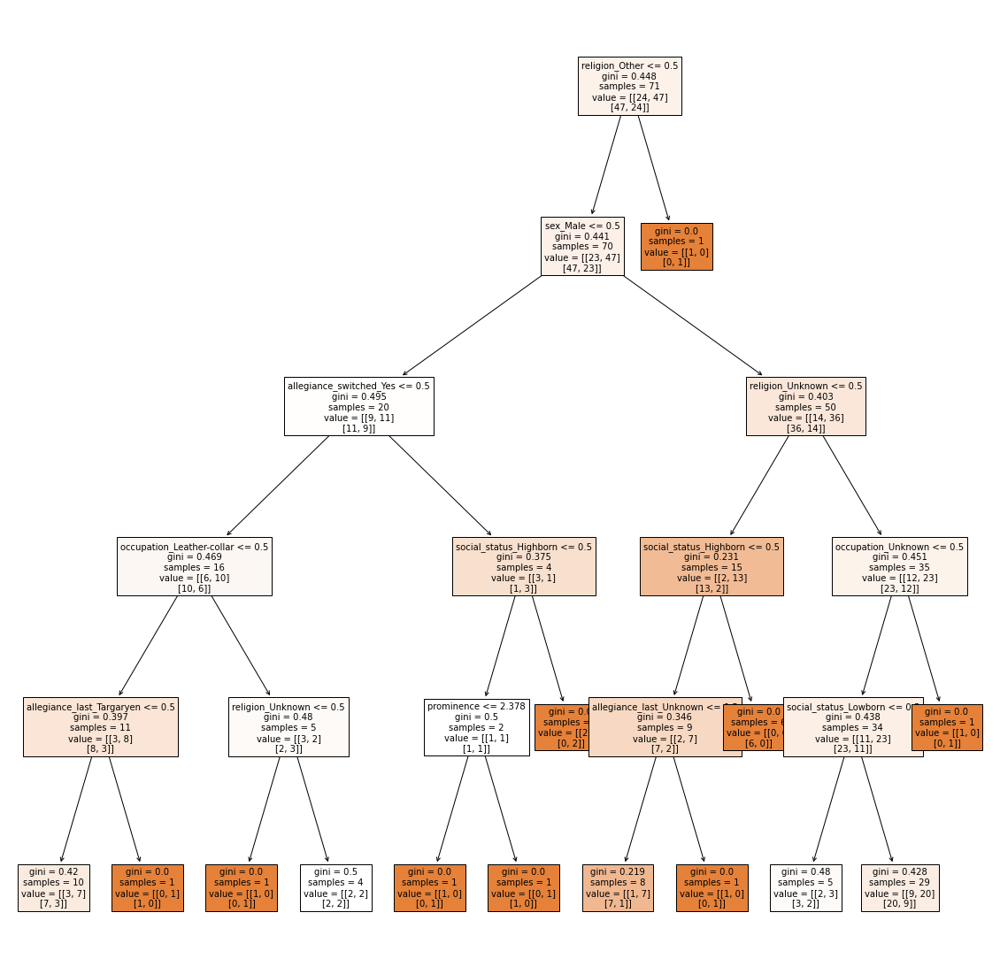

In [92]:
plt.figure(figsize=(20,20))
tree.plot_tree(model_tree.fit(x_test, y_test), 
               fontsize=10,
               feature_names = x_test.columns,
               class_names = y_test.columns,
               filled = True
              )
plt.show()

The *Gini index* or *Gini impurity* measures the degree or probability of a particular variable being wrongly classified when it is randomly chosen. We can also export the tree in `Graphviz` format using the `export_graphviz` exporter.  Check more [here](https://scikit-learn.org/stable/modules/tree.html)

In [ ]:
!pip install graphviz

### Advantages and Disadvantages of Decision Trees

The major advantage of using decision trees is that they are intuitively very easy to explain. They closely mirror human decision-making compared to other regression and classification approaches. They can be displayed graphically, and they can easily handle qualitative predictors without the need to create dummy variables.

However, decision trees generally do not have the same level of predictive accuracy as other approaches, since they aren’t quite robust. A small change in the data can cause a large change in the final estimated tree.




# Random Forest

Random forest is a powerful, general classifier algorithm. It is called random forest because it uses a collection of decision trees!

First we set the number of trees you want to build. Then you take a random sub sample of the data and build a decision tree on it. You repeat this process for every tree. Each tree should be built on it’s own sub sample of the data. Now we have a big collection of decision trees.

If we want to make a prediction, first we make a prediction using every tree in the set, then we take the average answer. For example, if we have 10 trees and 3 of them guess that a loan will not be repaid and 7 guess that it will, then our answer will be a 70% chance that the loan is repaid.

![](images/random_forest.jpg)

This has a big advantage over decision trees because decision trees can be very sensitive to small changes in data. A slightly different dataset will give a totally different tree structure. We can “average” over the possible tree structures for the data by using a random forest.

This type of model building, where we average across several models, is often called “ensemble learning”.

Let’s see an example in Python. Again, we import he model, define the model object and finally fit to our data.

In [93]:
from sklearn.ensemble import RandomForestClassifier

model_forest = RandomForestClassifier(n_estimators = 10,
                                     random_state=0)


We will use the same dataset as for the previous decission tree example

In [94]:
model_forest.fit(x_train, y_train)

RandomForestClassifier(n_estimators=10, random_state=0)

Here we set n_estimators to be 10, because we are using 10 decision trees.

In [95]:
model_forest.score(x_test, y_test)

0.971830985915493

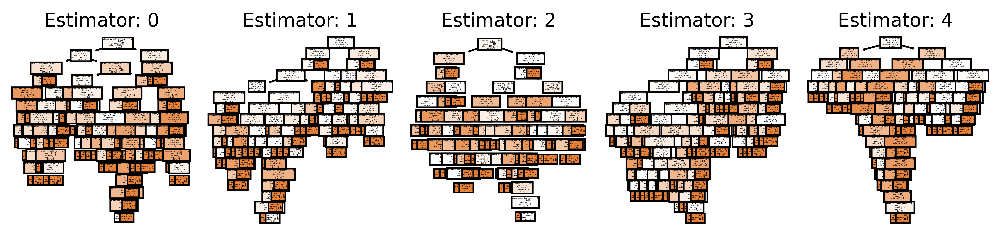

In [96]:
# This may not the best way to view each estimator as it is small

fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=900)
for index in range(0, 5):
    tree.plot_tree(model_forest.fit(x_train, y_train).estimators_[index],
                   feature_names = x_test.columns, 
                   class_names=y_test.columns,
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)


This is an amazing example about [RandomForest](https://www.kaggle.com/raviolli77/random-forest-in-python)

## Segmentation & Clustering


The overarching purpose of segmentation and clustering are similar - splitting up your data into subgroups which are 'similar'. But they differ in how we go about creating these groups. 

There are lots of real-world examples of these:

* **Marketing**: grouping people with the same willing power to buy a specific product based on their similarities. 
* **Insurance**: using clustering techniques to identify fraudulent insurance claims.
* **Geo-demographic**: splitting up the population based on geographical and demographic similarities. 
* **Education-planning**: identifying groups of universities based on their tuition, geographic location, quality of education, type of degree programs.
* **Finance**: grouping customers based on their credit history.

When introducing segmentation and clustering we shall consider the following dataset, which has information on customers of a particular shop. 




In [97]:
customers = pd.read_csv('data/mall_customers.csv')

In [98]:
customers.head()

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


# Segmentation

Segmenting is the process of putting customers into groups based on similarities. So you know before starting how you want to split your groups. The user manually defines boundaries to split characteristics by e.g. for customer data may split the following:

* Age over and under 40 
* Earnings over or under $30k a year. 

So we end up with the following groups:

1. Under 40 & earns under $30k

2. Over 40 & earns under $30k

3. Under 40 & earns over $30k

4. Over 40 & earns over $30k 

So for segmentation we will have a business purpose before splitting to know which rules to apply (e.g. for this example our buisness may have 2 different products targeted to those who earn over and under $30k, and so this split makes sense for our business) and so would need business context and understanding for this. 

Segmentation can be straightforward when only have a few characteristics but may have many many more - and how do you know how many characteristics to split by. Is age and income enough or should you also split by spending score? It may not be feasible for you to go through hundreds of types of data, finding relationships between each. We would want to understand the relationships between all these characteristics - this is where clustering can come in. 


# Clustering

Clustering is a machine learning technique that involves grouping of data points. Given a set of data points, we can use a clustering algorithm to classify each data point into a specific group. In theory, data points that are in the same group should have similar properties and/or features, while data points in different groups should have highly dissimilar properties and/or features. We can use clustering analysis to gain some valuable insights from our data by seeing what groups the data points fall into when we apply a clustering algorithm.

For example, if you had the hypothetical data below, you may run cluster analysis on it and get back three clusters showing the following: 


![](images/clustering_intro.jpg)


In this hypothetical case, we have three clusters showing how our data best clusters together. In reality, we may have some idea of the groups the algorithm will find, or it may find something unexpected. Unlike the classification algorithms above, clustering can find any number of groupings in the data. Deciding how many clusters we want is known as setting the algorithm's _granularity_.

For our customer data we may be interested in the type of people that come to our shop and if there are groups of similar type of people that we can target with particular marketing and campaigns depending on their attributes and behaviour. 

In our customer dataset we can treat our data as unlabelled and say that we aren't trying to predict a certain attribute (say income or spend score) but that we are interested in groups (clusters) of customers showing similarities - of which there are many different number ways of grouping. In this case, we could find that that 3 clusters define our full data pretty well, say those over 38 who have income of over $\$45k$, those over 38 who have an income of under $45k and those under 38.. **We haven't defined any inputs/rules other than potentially the number of groups we want** (in this case 3), the algorithm has defined these groups for us. This differs from segmentation where we defined the rules for splitting the groups. Clustering is often used when trying to profile customers or groups of people. 

The result is a segmented dataset, which is also the end result of segmenting, but the process to achieving it differs. 

For clustering we will still want some consideration which variables we want to include to some degree. We don’t want to just chuck in thousands of variables as some relationships may appear 'by chance' just because we have put in so many. Again, it will depend on purpose and context. For example we may hold people’s eye colour but the purpose of our analysis is to target for a campaign sales of jackets and we know these are unrelated. 

Note that not all data is ‘good’ for clustering. If there aren’t ‘clear/natural’ groupings of similar data then it may not appropriate. **Homogeneous** means that the consumers within each segment are relatively similar to each other, in terms of their characteristics. **Heterogeneous** means that the different segments should be quite distinct and different from each other. We will discuss this more later in the day. 



## Labelling clusters 

After clusters have been created often you will want to give them labels to give them meaning and context. This is common in marketing when have created groups of customers (and then may overlay their product purchases onto the clusters to see what type of products each group is buying) in order to create targeted advertising campaigns. For example the following groups may have been created via clustering and then via manual inspection can see what similarities are within the groups and can 'label' them (e.g. 'super fans') and often small 'bios' are written about each group:


![](images/group_labels2.png)

![](images/group_labels1.png)

Once have clusters/segments we may define a marketing strategy for each group and target appropriately. 

# Clustering Algorithms

Just like every other aspect of machine learning, there are many different clustering algorithms which we could use and they each have different specialities. There are more than 100 algorithms which we _could_ use, but only a few are in widespread use outside purely academic circles. They can be broadly grouped as follows:

1. **Connectivity Models** These are based on the idea that a data point on a graph will have more in common with a point which is close to it in space than one which is further away. They take one of two approaches to clustering: either all points are treated as individual clusters and then aggregated together, or or all start in one cluster which is then divided. **Hierarchical clustering**, is an example of this, which we will look at today. 

2. **Centroid Models** In these models we tell the algorithm how many clusters we are aiming to have then allow it to find the optimum centre-point on the graph for each of those clusters. These are arguably not as "unsupervised" as other algorithms, since we provide that information of how many clusters we want, but must also have some knowledge of the dataset in order to do so. A popular example is **K-Means clustering**, which we will also look at in-depth later today.

3. **Distribution Models** These are probability-based models where clustering is driven by the probability that all data points belong to the same distribution (eg. normal). These are less useful in general since they are prone to overfitting, but if this is managed properly they still have their niche.

4. **Density Models** These models simply search the space for points which are closely grouped and assign them to the same cluster. Like the centroid models these require a degree of user input to define how many clusters there should be, but since the algorithm isn't as dependent on the data we need less knowledge of it first. 


![](images/algorithms.png)

### Additional Resources

* [A guide to selecting an algorithm](https://hackernoon.com/choosing-the-right-machine-learning-algorithm-68126944ce1f)
* [The maths behind some common distance measures](https://www.datanovia.com/en/lessons/clustering-distance-measures/#methods-for-measuring-distances)
* [5 popular clustering algorithms in data science](https://towardsdatascience.com/the-5-clustering-algorithms-data-scientists-need-to-know-a36d136ef68)

# Hierarchical Clustering

Hierarchical clustering, also known as hierarchical cluster analysis, is an algorithm that groups similar objects into groups called clusters. 

**Hierarchical clustering** is an unsupervised technique which takes our starting point of many individual clusters and gradually groups them together until a user-defined end point is reached. The endpoint is a set of clusters, where each cluster is distinct from each other cluster, and the objects within each cluster are broadly similar to each other. The overall end goal is to group our data together to look for patterns. 

It's worth noting that we could do hierarchical clustering in reverse, ie. start with one cluster and split it until we reach our target number. This is known as _divisive_ hierarchical clustering (as opposed to the _agglomerative_ clustering we're looking at here) and is rarely done in practice.

![](images/hierarchical_clustering.png)

Hierarchical clustering starts by treating each observation as a separate cluster. Then, it repeatedly executes the following two steps:  
 
  (1) identify the two clusters that are closest together       
  (2) merge the two most similar clusters  
  
This continues until all the clusters are merged together (see the diagram above).

The main output of hierarchical clustering is a **dendrogram**.  Let's look at a couple now. 


## Dendrograms

A dendrogram is a diagram which shows the hierarchical relationship between data points, where the height of the join between two clusters indicates how close they are together. Take a look at the following:


![](images/cluster_and_dendrogram.png)

Here this shows us the clusters on the left, and the dendrogram on the right. Imagine that underneath the letters (A,B,C..) are data points, that have been grouped into clusters by our algorithm. So, what does this dendrogram tell us? 

Well, first thing to note is that the horizontal lines joining letters together denote that two clusters are close in distance (and may indeed be part of the same cluster, depending on your cut offs). Next thing to note is that the distance of the line joining clusters relative to the x axis tell you something as well. The closer a horizontal joining line is to the x axis, the closer the clusters are. 

So in our case, our dendrogram tells us that clusters E and F are the closest together, as they have the shortest distance between the joining line and the x axis. Next, follows clusters A and B. Cluster D could be grouped with E and F and is the next closest relationship, and cluster C could be grouped with E, F and D, but has the most distance between clusters. 


## How do you define your clusters?


A critical part of the clustering process is the evaluation of **how similar different data points are**. This evaluation guides the size and shape of the clusters generated. The formulae used are known as **distance measures**, and just like the algorithms using them there are many. They can be broadly divided into two categories: _classical_ and _correlation_ measures. Classical measures are based on geometric distances between points on a graph, while correlation measures are based on (as the name suggests) the correlation between points. In day-to-day use it is important to know what they are and how they are arriving at their conclusions, but when we run clustering algorithms using R (or indeed other languages) they are usually included in that process. As such, we won't focus on the nuts and bolts of what's going on in each case. 

<br>
Let's take a look at our previous example again:

![](images/cluster_and_dendrogram.png)

In this example, the distance between two clusters has been computed based on length of the straight line drawn from one cluster to another. This is commonly referred to as the *Euclidean distance*, and this would be a _classical_ method. 

> *Note: The **Euclidean distance** between two points is the straight-line distance between them on the graph. If you remember Pythagoras Theorem from school then it uses that - so you can use this as an argument when people say they never use anything they learnt in high school maths!*


<details>
<summary><b> Maths here</b> </summary> 

Although R is doing it for us, that distance is relatively easy to calculate. In 2-dimensions, if we have two points _p_ and _q_:
$$p = (p_1, p_2) \\q = (q_1, q_2)$$
Then the distance between them _d_:
$$d(p, q)$$
Can be calculated using the formula below:
$$d(p, q) = \sqrt{(q_1 - p_1)^2 + (q_2 - p_2)^2}$$
In a n-dimensional space the formula generalises to:
$$d(p, q) = \sqrt{\sum\limits_{i=1}^n (p_i - q_i)^2}$$

</div>


Your choice of distance metric will depend on many things like which field you work in, what the standard cut offs in your line of work are, and any other theoretical basis of your field. That is, a distance metric needs to define similarity in a way that is sensible for the field of study. For example, if clustering crime sites in a city, city block distance may be appropriate (or, better yet, the time taken to travel between each location).

On the other hand, if we want to identify clusters where presence of a variable is important rather than its magnitude (eg. shoppers buying a particular item, ignoring how many they bought) then we would use a correlation measure. This will still produce clusters in the same way as an algorithm using a classical measure, but there may be more overlap in the visual representation with a "messier" end result.  

Where there is no theoretical justification for an alternative, the Euclidean should generally be preferred, as it is usually the appropriate measure of distance in the physical world.



![](images/hierarch.gif)

Let's consider 5 tagged DNA sequences 

In [99]:
df = pd.read_csv('data/msa.csv')
df.head()

,type,seq
0,Alpha,AACGTGGCCACAT
1,Beta,AAGGTCGCCACAC
2,Gamma,CAGTTCGCCACAA
3,Delta,GAGATTTCCGCCT
4,Epsilon,GAGATCTCCGCCC


In [100]:
matrix = df.values

We must first encode the bases with integers 

In [101]:
dic = {'A': 0, 'C': 1, 'G':2, 'T':3}

In [102]:
new_inputs = []
for seq in matrix[:, 1]:
    new_seq = []
    for amin in seq:
        new_seq.append(dic[amin])
    new_inputs.append(new_seq)

In [103]:
new_inputs

[[0, 0, 1, 2, 3, 2, 2, 1, 1, 0, 1, 0, 3],
 [0, 0, 2, 2, 3, 1, 2, 1, 1, 0, 1, 0, 1],
 [1, 0, 2, 3, 3, 1, 2, 1, 1, 0, 1, 0, 0],
 [2, 0, 2, 0, 3, 3, 3, 1, 1, 2, 1, 1, 3],
 [2, 0, 2, 0, 3, 1, 3, 1, 1, 2, 1, 1, 1]]

In [104]:
from sklearn.cluster import AgglomerativeClustering

In [105]:
hc = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='average')
clusters = hc.fit_predict(new_inputs)

In [106]:
clusters

array([0, 0, 0, 1, 1], dtype=int64)

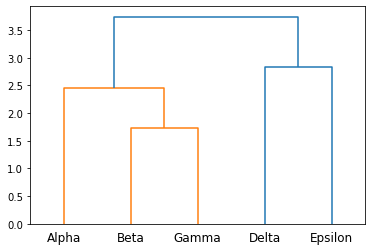

In [107]:
from scipy.cluster.hierarchy import dendrogram, linkage
Z = linkage(new_inputs)
dendrogram(Z, labels=['Alpha', 'Beta', 'Gamma', 'Delta', 'Epsilon']) 
plt.show()

# K-Means Clustering

The hierarchical clustering methods we looked at earlier are great at answering yes/no questions, but when we want to take a more granular look at our data they are less effective. In that instance we may want to take a look at **k-means clustering**.

### Use Cases

Dendrograms are great for showing us the similarities between datapoints, but aren't that easy to get a quick read from. We can see how datapoints are ultimately grouped together at whatever granularity we like, but without time and investigation we can't immediately tell that a given point should be grouped with any other. 

Enter k-means clustering. The graphs produced by this algorithm still show the clusters in the data, but instead of showing the clusters at such a granular level they instead show the final groupings. As such it is immediately obvious which cluster a data point belongs to. There is the added benefit that it _may_ be possible to immediately see which cluster any new data points belong to.

These groupings will most likely not be explicitly defined in the data. The corollary to this is that they represent patterns in the data which may not be obvious to the user. Let's take a look at what we mean by manually clustering some data:


In [108]:
df = pd.DataFrame({'age':[18, 21, 22, 24, 26, 26, 27, 30, 31, 35, 39, 40, 41, 42, 44, 46, 47, 48, 49, 54],
                   'spend' : [10, 11, 22, 15, 12, 13, 14, 33, 39, 37, 44, 27, 29, 20, 28, 21, 30, 31, 23, 24]
                  })


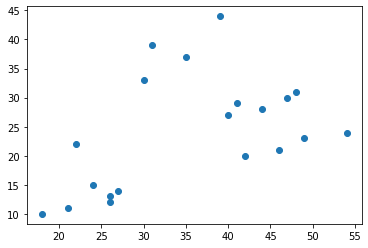

In [109]:
plt.scatter(df['age'], df['spend'])

Let's say we're running a shop and have a dataframe containing details of our customers' ages and the amount of money they spent in our shop. We're plotting age along the x-axis and spend on the y-axis. There are some fairly obvious groupings in the plotted points: one in the bottom left, one top-middle and one middle-right. Although **they weren't defined in our original data**, these groups are still present and can be used to inform future business decisions. In this case we have observed a pattern that:

* younger people are spending less (less financial security), 
* those in their thirties are spending more (job security and fewer commitments)
* middle-aged and older people are spending less again (other financial obligations)

Looking for patterns in customer data is one example business case, but there are of course others. Any scenario where we want to find patterns could be a candidate for k-means clustering, be it looking at financial data, environmental data or student performance. We can even use it in preparing our datasets, with it being particularly powerful in grouping variables for dimensionality reduction.

In order to find such groupings, however, they must be derived from variables which are present in our dataset in the first place. While this may seem obvious, it bears repeating here. As we'll see later, the clusters are also **constructed iteratively** in a similar way to our dendrograms. That means that a point _may_ end up in the "wrong" cluster, although this will likely be rectified as the algorithm continues. It's also worth remembering that our perception of "wrong" is based on our own inspection of the data; we may be wrong ourselves about where we feel a point should be clustered.


# K-means in Python

Although there are quirks to the methods each language uses for k-menas clustering, the general process is the same regardless of setting:

1. Initial **centroids** which represent the "centre" points of each cluster are chosen. We declare as many as we need clusters.

2. Each data point is grouped with the centroid it is closest to. Often we use the Euclidean distance between the plot and the centroid, but other distance measures will work too.

3. For each group, the centroid is moved to the point representing the mean position of the points within the group. This may be a small movement, or it may be significant.

4. The data points are re-grouped among the centroids. It is possible that at this stage that points will move between groups, depending on where the centroids have been moved to.

Stages 3 and 4 are repeated until no observations change groups after moving the centroids, resulting in our final groups. It is not necessary for the groups to be of the same size.

The algorithms used to select our initial centroids ensure that they are chosen randomly, meaning that the clustering process _should_ give different results every time. This is not necessarily a bad thing; as we said earlier, where random selection is involved we want to see some variance in the final results. It does, however, mean that it is virtually impossible to recreate the results of a clustering unless working with a very small dataset.


![](images/k4XcapI.gif)

You can find an excellent tutorial [here](https://mubaris.com/posts/kmeans-clustering/)

## A bit more advanced example using K-means on Images



In [110]:
from sklearn.metrics import pairwise_distances_argmin
from sklearn.utils import shuffle
from PIL import Image
import IPython.display

In [111]:
demo_img = Image.open('images/cantera.jpg')

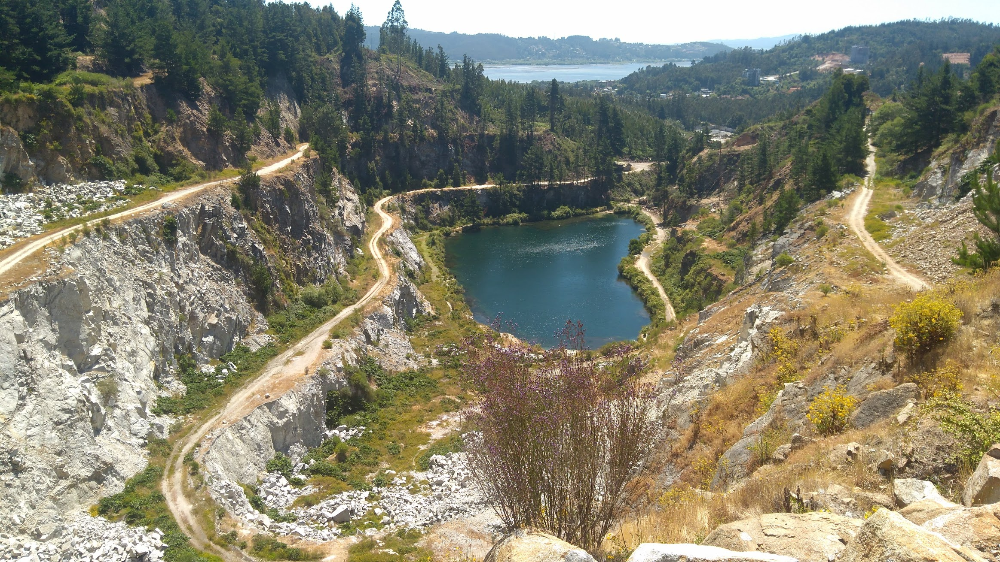

In [112]:
display(demo_img)

In [113]:
demo_img = np.array(demo_img, dtype=np.float64)/255

In [114]:
w,h,d = original_shape = tuple(demo_img.shape)

In [115]:
image_array = np.reshape(demo_img, (w * h, d))

In [116]:
from sklearn.cluster import KMeans

In [117]:
image_array_sample = shuffle(image_array, random_state=0)[:1000] # 1000 random pixels to train 

n_colors = 3
kmeans = KMeans(n_clusters=n_colors, random_state=0)
kmeans = kmeans.fit(image_array_sample)

In [118]:
labels = kmeans.predict(image_array) #We predict over the entire set of pixels 

In [119]:
codebook_random = shuffle(image_array, random_state=0)[:n_colors] # We define random centroids 
# We calculate the minimum distance between each pixel and the centroids 
labels_random = pairwise_distances_argmin(codebook_random,
                                          image_array,
                                          axis=0)

In [120]:
def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the code book & labels"""
    d = codebook.shape[1]
    image = np.zeros((w, h, d))
    label_idx = 0
    for i in range(w):
        for j in range(h):
            image[i][j] = codebook[labels[label_idx]]
            label_idx += 1
    return image

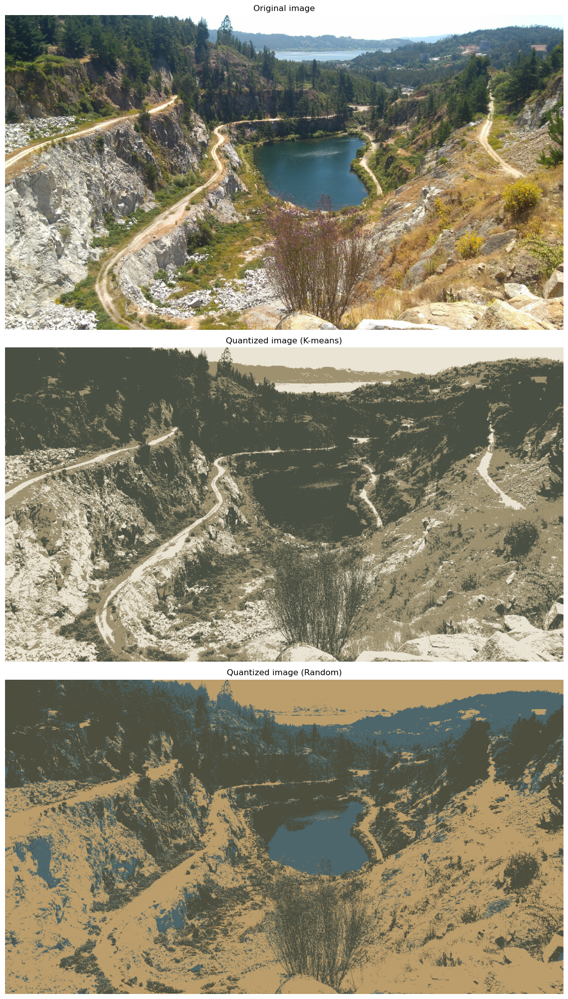

In [121]:
fig, axes = plt.subplots(3, 1, figsize=(20,20), dpi=100)

axes[0].imshow(demo_img)
axes[0].axis('off')
axes[0].set_title('Original image')

axes[1].imshow(recreate_image(kmeans.cluster_centers_, labels, w, h))
axes[1].axis('off')
axes[1].set_title('Quantized image (K-means)')

axes[2].imshow(recreate_image(codebook_random, labels_random, w, h))
axes[2].axis('off')
axes[2].set_title('Quantized image (Random)')

fig.tight_layout()

## Correlation coefficient


The **Pearson correlation coefficient** denoted by $r$ measures the **linear tendency** of two variables.

* It has no units (it's just a number)
* It takes bounded values:
  - approaching $r = 1$ when the variables are strongly positively linearly correlated
  - approaching $r = -1$ when the variables are strongly negatively linearly correlated
  - near $r = 0$ when the variables are not correlated

Values $r = +1$ or $r = -1$ indicate a **perfect linear relationship**. This just means that if we plotted the data, it would fall upon a perfect straight line. We will essentially never see this for real data sets due to random noise! 



We've seen that the sign of $r$ has a simple meaning, but what about its magnitude? J. D. Evans (1996) suggests the following scale

|  magnitude of $r_{xy}$  |  strength of correlation  |
|-------------------------|---------------------------|
| 0                       | none                      |
| 0.01 - 0.19             | very weak                 |
| 0.20 - 0.39             | weak                      |
| 0.40 - 0.59             | moderate                  |
| 0.60 - 0.79             | strong                    |
| 0.80 - 0.99             | very strong               |
| 1                       | perfect                   |

Finally, a word of warning! The correlation coefficient is a blunt instrument: we can run `corr()` on **any** bivariate dataset and **get a number out**, regardless of what the real trend (if any) is in the data. 


> *We should always visualise data before trusting summary statistics like the correlation coefficient!*


It might be that our data has a definite non-linear trend: if so, we should try to quantify that trend rather than assuming a linear association.


# The most famous phrase in statistics!

What's the most famous pithy phrase in statistics? There's a good chance that many of you will have read or heard that

> **"Correlation is not causation."**

Just because two variables are **correlated**, it does not mean that one of them **causes** the change in the other! 

Consider two variables: the number of pairs of `sunglasses_sold` and the amount of `ice_cream_sold` at a beach shop each week. 

There's a good chance that if we plot this data and calculate the correlation coefficient we'll find that the variables are **positively correlated**. 

Does this mean that an increase in the `sunglasses_sold` **causes** the amount of `ice_cream_sold` to increase? No way!! We don't have a strong enough basis to make this conclusion.


## The 'third variable' problem

The simplest realistic model might be that **both** these variables are themselves causally related with a third **'hidden variable'**, e.g. `number_of_sunny_days` each week. An increase in `number_of_sunny_days` in a given week **causes** increases in both `sunglasses_sold` and `ice_cream_sold`!  


Sometimes this is also called a **confounding variable** - a variable you **didn't** include in your analysis that is causally related with variables that you **did** include. The presence of confounding variables makes it difficult to form conclusions about causal relationships.


<blockquote class='task'>
<b>Task - 2 mins</b> See if you can suggest any confounding variable(s) for the following associations:<br><br>
<center>"1. Sleeping with shoes on is strongly correlated with waking up with a headache. Therefore, sleeping with shoes on causes headaches."</center><br><br>
<center>"2. Atmospheric CO<sub>2</sub> level and obesity levels have both increased sharply since the 1950s. Therefore, atmospheric CO<sub>2</sub> causes obesity."</center><br><br>
<center>"3. The more bacon someone eats, the higher their blood pressure. Therefore bacon causes hypertension."</center><br><br>
<details>
<summary><b>Solution<b></summary>
1. Amount of alcohol consumed the day before<br>
2. GDP - rich populations eat more food and produce more CO<sub>2</sub><br>
3. Preference for salty food - more likely to eat bacon, more likely to have hypertension
</details>
</blockquote>

## The 'directionality' problem

Even if the two variables **are** causally related, there is nothing in the statistics to indicate the **directionality** of causation.

Imagine a marketing study on sales of confectionery with two variables: 

* `number_of_TV_ads_run` in a given week
* `amount_of_chocolate_sold` in a given week.

If we discover a positive correlation between these variables, common sense might suggest that it is an increase in the number of TV ads run that **causes** an increase in chocolate sales, and vice-versa, but, as described, the study provides **no statistical basis to indicate a direction of causation**! 


### How do we prove causation?

This sounds like a minefield! How do we prove causation between variables if strong correlation isn’t enough?

Ideally with a randomised controlled experiment.

In this experiment, we:

1. **Randomly** split our experimental sample into two groups: ‘control’ and ‘treatment’, and try to make sure sample elements with potentially confounding factors are spread as evenly as possible over both groups and/or restricted to a small range e.g. if age is a potential confounder, limit the experiment to say 20-25 year old people
    
2. Next, make some active intervention (i.e. change the variable we are testing the effect of) with the ‘treatment’ group, and do not intervene at all with the ‘control’ group.
3. Gather and analyse outcome data from both groups.

This study gives us the basis to say whether or not our ‘intervention’ variable causes any change we find in the `outcome` variable.



**Hill’s Criteria of Causality** are also a useful guide. The following summary of them comes from the excellent [Stats With Cats blog](https://statswithcats.net/)!

- **Strength**: A relationship is more likely to be causal if the correlation coefficient is large and statistically significant.

- **Consistency**: A relationship is more likely to be causal if it can be replicated.

- **Specificity**: A relationship is more likely to be causal if there is no other likely explanation.

- **Temporality**: A relationship is more likely to be causal if the effect always occurs after the cause.

- **Gradient**: A relationship is more likely to be causal if a greater exposure to the suspected cause leads to a greater effect.

- **Plausibility**: A relationship is more likely to be causal if there is a plausible mechanism between the cause and the effect.

- **Coherence**: A relationship is more likely to be causal if it is compatible with related facts and theories.

- **Experiment**: A relationship is more likely to be causal if it can be verified experimentally.

- **Analogy**: A relationship is more likely to be causal if there are proven relationships between similar causes and effects.

